In [1]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl
import corner
import seaborn.apionly as sns
from tqdm import tqdm
import pandas as pd
%matplotlib inline

/Users/bcook/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/Users/bcook/anaconda/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [2]:
sns.set_context('poster')
sns.set_style('ticks')

In [160]:
class PCMD_run():
    
    def __init__(self, df_file, truths=None, simple=False, age_bins=np.array([6., 7., 8., 8.5, 9., 9.5, 10., 10.2]),
                title=''):
        self.simple = simple
        self.df = pd.read_csv(df_file, compression='gzip')
        self.title = title
        self.accept_fracs = self.df.groupby('walker')['accept_frac'].mean().values
        if simple:
            self.params = np.array(['logz', 'logdust', 'logNpix', 'logage', 'lnprob'])
        else:
            self.params = ['logz', 'logdust']
            for i in range(7):
                self.params.append('logSFH%d'%i)
            self.params = np.append(self.params, ['logNpix', 'lnprob'])
            logSFH = self.df[self.params[2:-2]].values
            logNpix = np.log10(np.sum(10.**logSFH, axis=1))
            self.df['logNpix']= logNpix
            self.age_bins = age_bins
        self.N_params = len(self.params)
        self.N_walkers = self.df['walker'].max() + 1
        self.N_steps = len(self.df) / self.N_walkers
        self.df = self.df[self.params]
        self.chains = {}
        for p in self.params:
            self.chains[p] = self.df[p].values.reshape((self.N_walkers, self.N_steps))
            
        vals = np.array(self.chains.values())
        self.accept_chain = np.mean(np.all(vals[:,:,:-1] != vals[:,:,1:], axis=0), axis=0)

        self.truths = truths
            
    def set_truths(self, truths):
        self.truths = truths
            
    def chain_plot(self, axes=None):
        if axes is None:
            fig, axes = plt.subplots(nrows=self.N_params, figsize=(8, 1.5*self.N_params), sharex=True)
        for c in range(self.N_params):
            col = self.params[c]
            for w in range(self.N_walkers):
                axes[c].plot(np.arange(self.N_steps), self.chains[col][w], 'k-', alpha=0.5, lw=1.)
            if self.truths is not None:
                axes[c].axhline(y=self.truths[c], ls='--', color='r')
            axes[c].set_ylabel(col)
        axes[-1].set_xlabel('Iterations')
        axes[0].set_title(self.title)
        plt.tight_layout()
        return axes
    
    def corner_plot(self, ax=None, **kwargs):
        df_temp = self.df.drop('lnprob', axis=1)
        fig = corner.corner(df_temp, truths=self.truths, axis=ax, **kwargs)
        fig.suptitle(self.title, fontsize='xx-large')
        plt.tight_layout()
        return fig
    
    def cumSFH_plot(self, ax=None, burn=0, interval=0.95):
        if self.simple:
            return None
        if self.truths is None:
            return None
        true_SFH = np.cumsum(10.**self.truths[2:-2])
        true_SFH /= true_SFH[-1]
        
        SFH = []
        for i in range(7):
            SFH.append(10.**self.chains['logSFH%d'%i][:,burn:].flatten())
        SFH = np.cumsum(SFH, axis=0)
        SFH = (SFH / 10.**self.chains['logNpix'][:,burn:].flatten()).T
        
        n_draws = SFH.shape[0]
        low = int(np.round(n_draws * (0.5 - 0.5*interval)))
        high = int(np.round(n_draws * (0.5 + 0.5*interval)))
                                      
        cum_means = np.mean(SFH, axis=0)
        cum_meds = np.median(SFH, axis=0)
        cum_intervals = np.sort(SFH, axis=1)[(low, high),:]
        cum_stds = np.std(SFH, axis=0)
        print(cum_means, cum_stds)
        log_ages = 0.5*(self.age_bins[1:] + self.age_bins[:-1])
        
        if ax is None:
            fig, ax = plt.subplots()
        ax.fill_between(log_ages, cum_intervals[0], y2=cum_intervals[1], color='k',
                        alpha=0.2, label=r'%d'%(interval*100)+'% Interval')
        ax.plot(log_ages, cum_means, c='k', marker='o', ls='')
        ax.plot(log_ages, cum_meds, c='r', marker='o', ls='')
        ax.plot(log_ages, true_SFH, ls='--', color='b', label='Truth')
        
        ax.set_xlabel('log age (yr)')
        ax.set_ylabel('cumulative SFH')
        ax.set_yscale('log')
        ax.legend(loc=0)
        ax.set_title(self.title)
        plt.tight_layout()
        
        return ax
    
    def accept_frac_plot(self, ax=None, kde=True, label=False, **kwargs):
        if ax is None:
            fig, ax = plt.subplots()
        if label:
            lab = self.title
        else:
            lab = ''
        if kde:
            sns.kdeplot(self.accept_fracs, ax=ax, label=lab, **kwargs)
        else:
            ax.hist(self.accept_fracs, histtype='step', label=lab, normed=True, **kwargs)
        
        return ax
    
    def accept_chain_plot(self, ax=None, label=False, **kwargs):
        if ax is None:
            fig, ax = plt.subplots()
        if label: 
            lab = self.title
        else:
            lab = ""
        ax.plot(self.accept_chain, label=lab, **kwargs)
        return ax

In [154]:
def FULL_truths(Npix=1e2):
    age_edges = np.array([6., 7., 8., 8.5, 9.0, 9.5, 10., 10.2])
    bin_widths = 10.**age_edges[1:] - 10.**age_edges[:-1]
    logsfhs = np.log10(Npix * bin_widths / np.sum(bin_widths))
    truths = np.append(np.array([-0.2, -2]), logsfhs)
    return np.append(truths, [np.log10(Npix), -np.inf])

def SSP_truths():
    return np.array([-0.2, -2., 2., 9.6, -np.inf])

def BURST_truths(Npix=1e2):
    age_edges = np.array([6., 7., 8., 8.5, 9.0, 9.5, 10., 10.2])
    bin_widths = 10.**age_edges[1:] - 10.**age_edges[:-1]
    bin_widths[1] *= 5
    logsfhs = np.log10(Npix * bin_widths / np.sum(bin_widths))
    truths = np.append(np.array([-0.2, -2]), logsfhs)
    return np.append(truths, [np.log10(Npix), -np.inf])

def TAU_truths(Npix=1e2):
    tau = 1e9
    age_edges = 10.**np.array([6., 7., 8., 8.5, 9.0, 9.5, 10., 10.2])
    exp_factors = np.exp(- age_edges / tau)
    logsfhs = np.log10(Npix * (exp_factors[:-1] - exp_factors[1:]))
    truths = np.append(np.array([-0.2, -2]), logsfhs)
    return np.append(truths, [np.log10(Npix), -np.inf])

def SSP_as_FULL_truths(Npix=1e2):
    logsfhs = np.array([-10., -10., -10., -10., -10., np.log10(Npix), -10.])
    truths = np.append(np.array([-0.2, -2]), logsfhs)
    return np.append(truths, [np.log10(Npix), -np.inf])

def FULL_as_SSP_truths(Npix=1e2):
    return np.array([-0.2, -2., 2., -np.inf, -np.inf])

/Users/bcook/anaconda/lib/python2.7/site-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


(array([  5.68367811e-04,   6.02916652e-03,   1.87595199e-02,
         5.83153648e-02,   1.88671695e-01,   6.33653355e-01,
         1.00000000e+00]), array([  1.25555102e-04,   1.11039294e-03,   1.62747709e-03,
         7.55070293e-03,   2.43665943e-02,   3.76646820e-02,
         2.98291944e-16]))


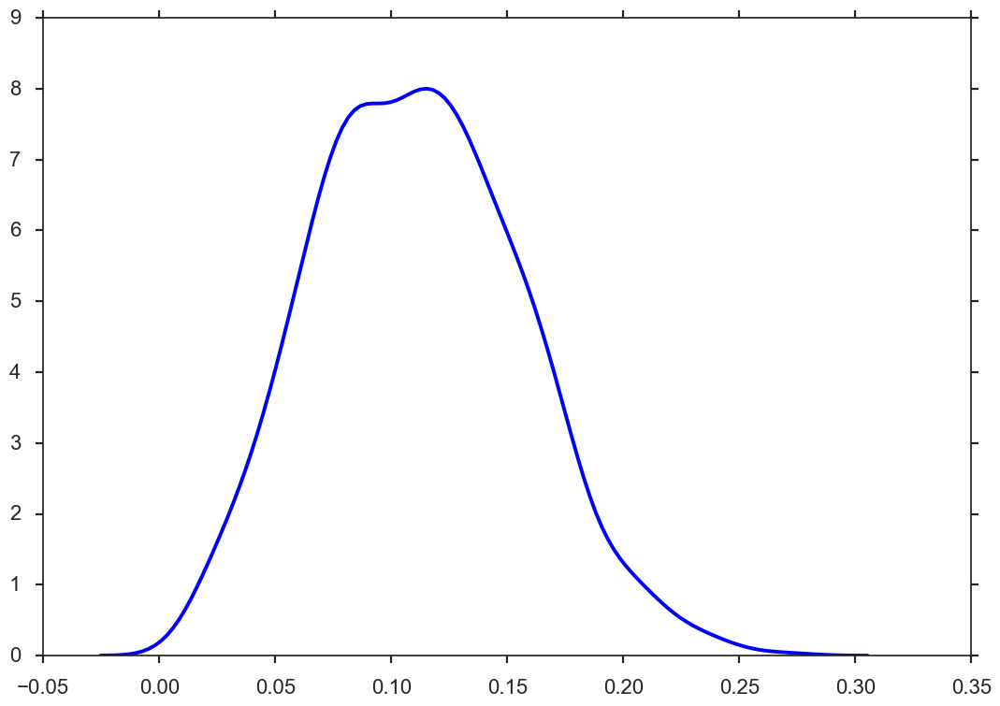

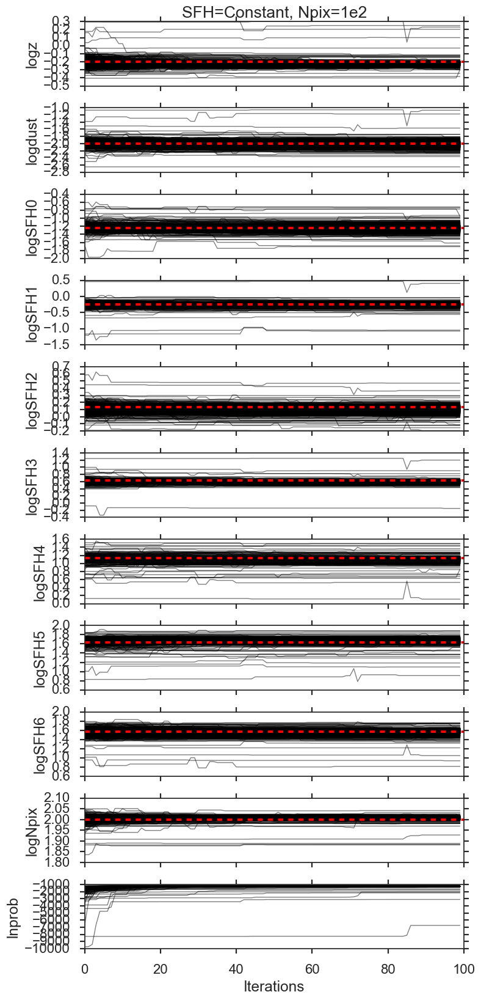

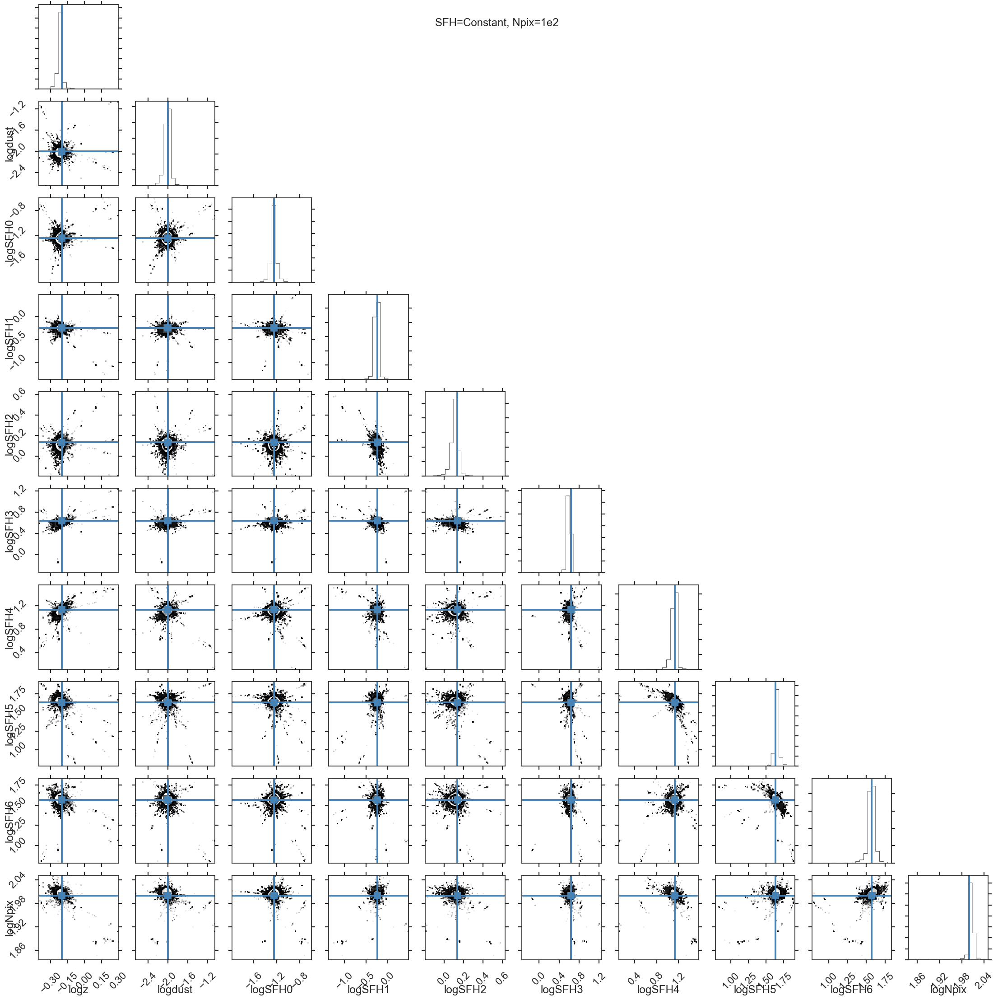

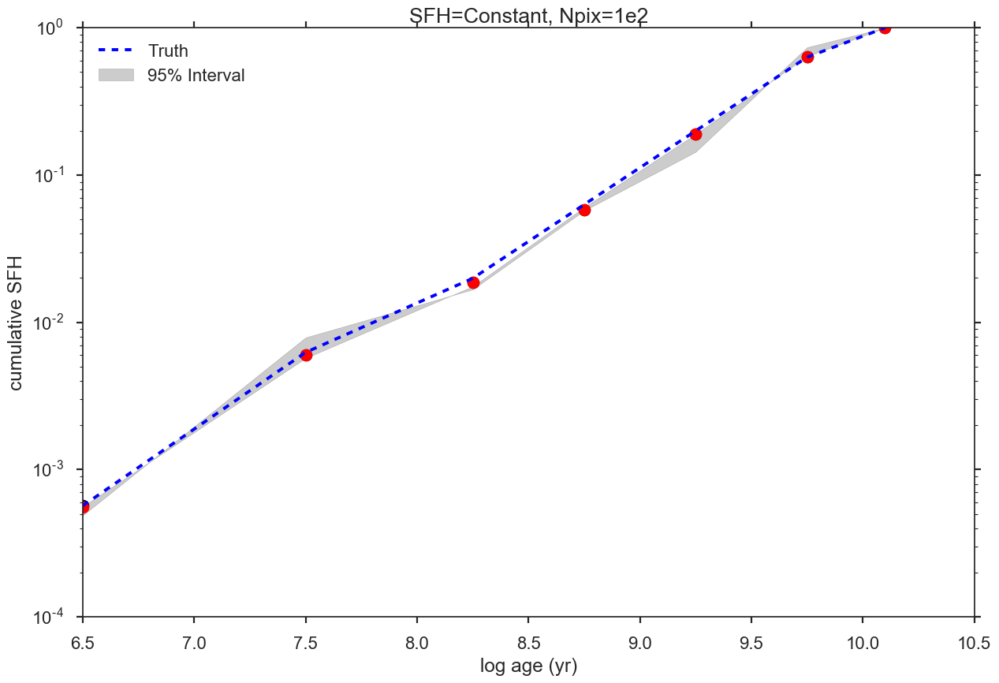

In [155]:
run_full = PCMD_run('results/FULL_mock.csv', truths=FULL_truths(), title='SFH=Constant, Npix=1e2')
run_full.accept_frac_plot()
run_full.chain_plot()
run_full.corner_plot()
run_full.cumSFH_plot()

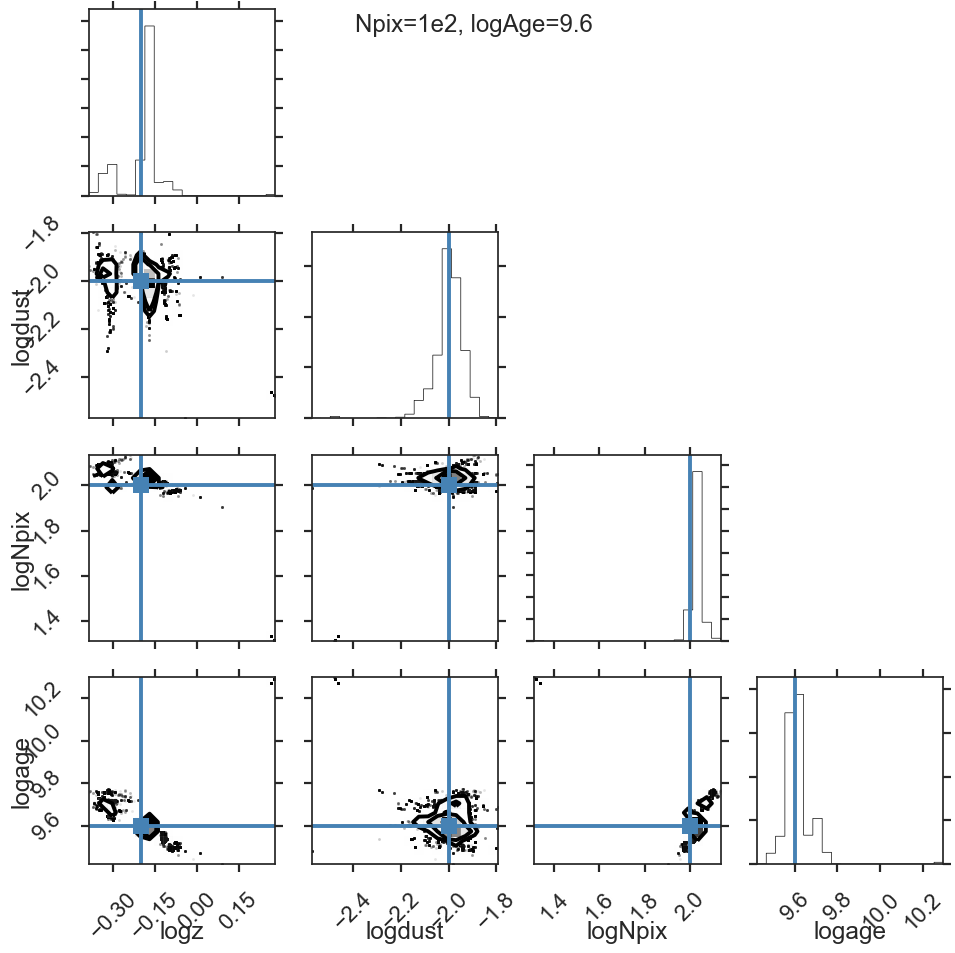

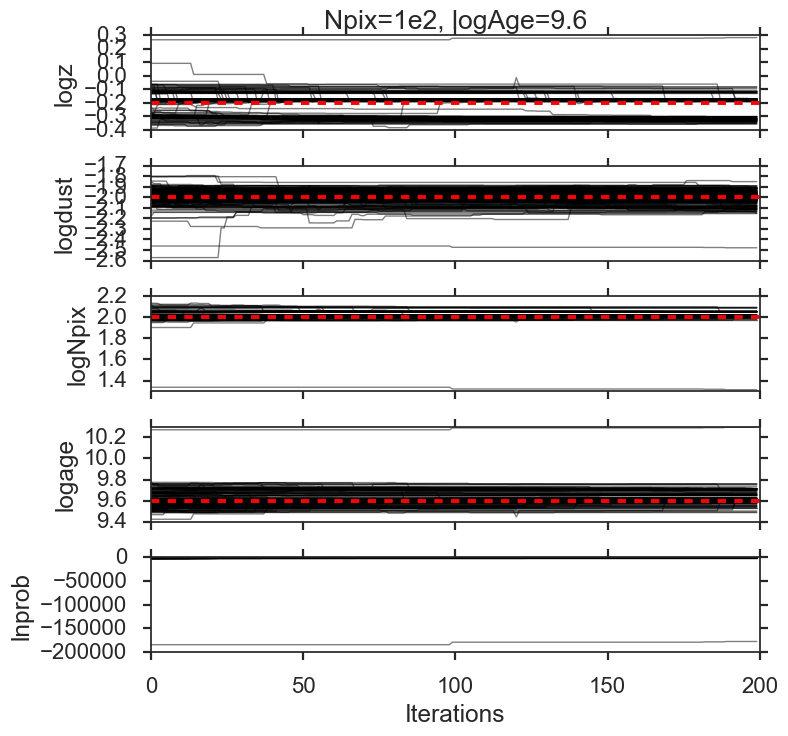

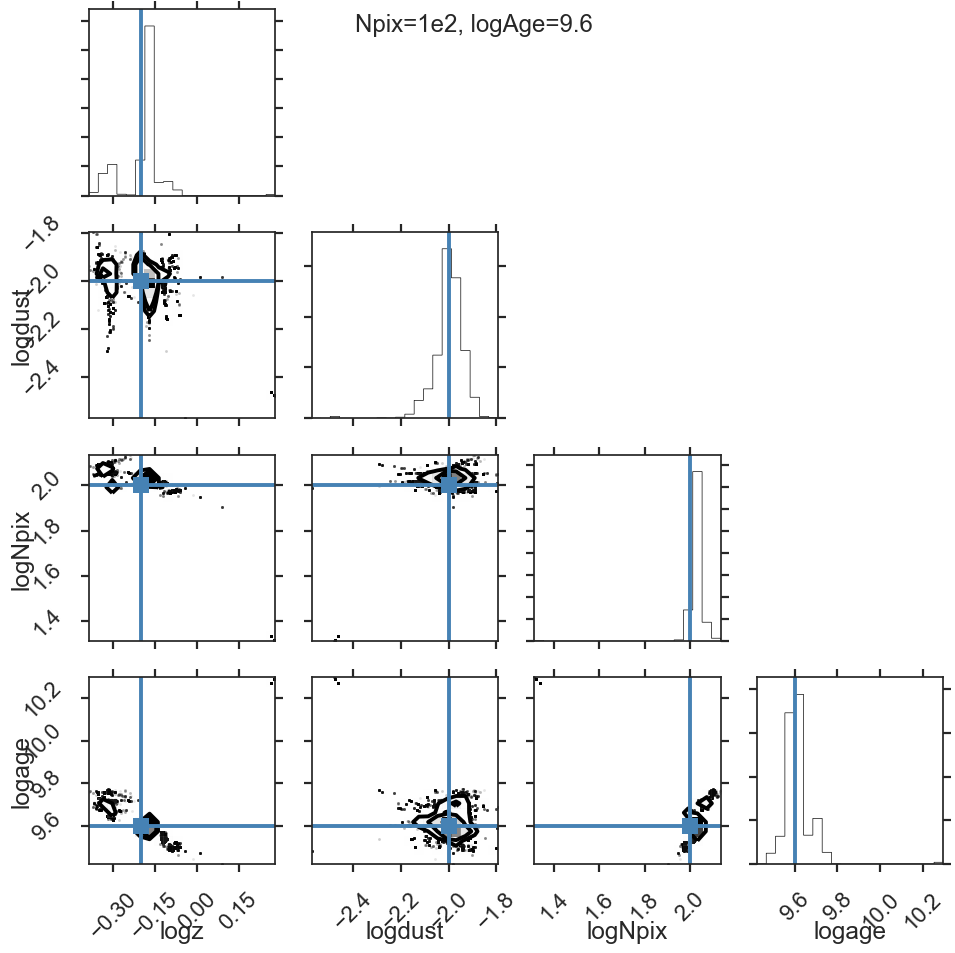

In [27]:
run_SSP = PCMD_run('results/SSP_mock.csv', truths=SSP_truths(), simple=True, title='Npix=1e2, logAge=9.6')
run_SSP.chain_plot()
run_SSP.corner_plot()

(array([  5.97945702e-04,   6.86888536e-03,   2.00636740e-02,
         6.47134133e-02,   1.99519183e-01,   6.24611509e-01,
         1.00000000e+00]), array([  9.44503603e-05,   1.22038919e-02,   1.38826598e-02,
         1.80882001e-02,   4.07356949e-02,   4.78359732e-02,
         5.23372484e-16]))


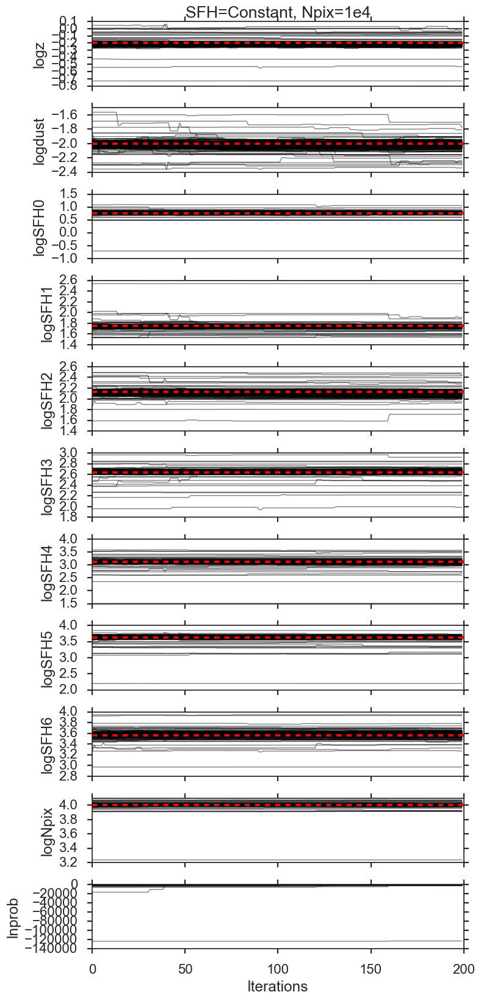

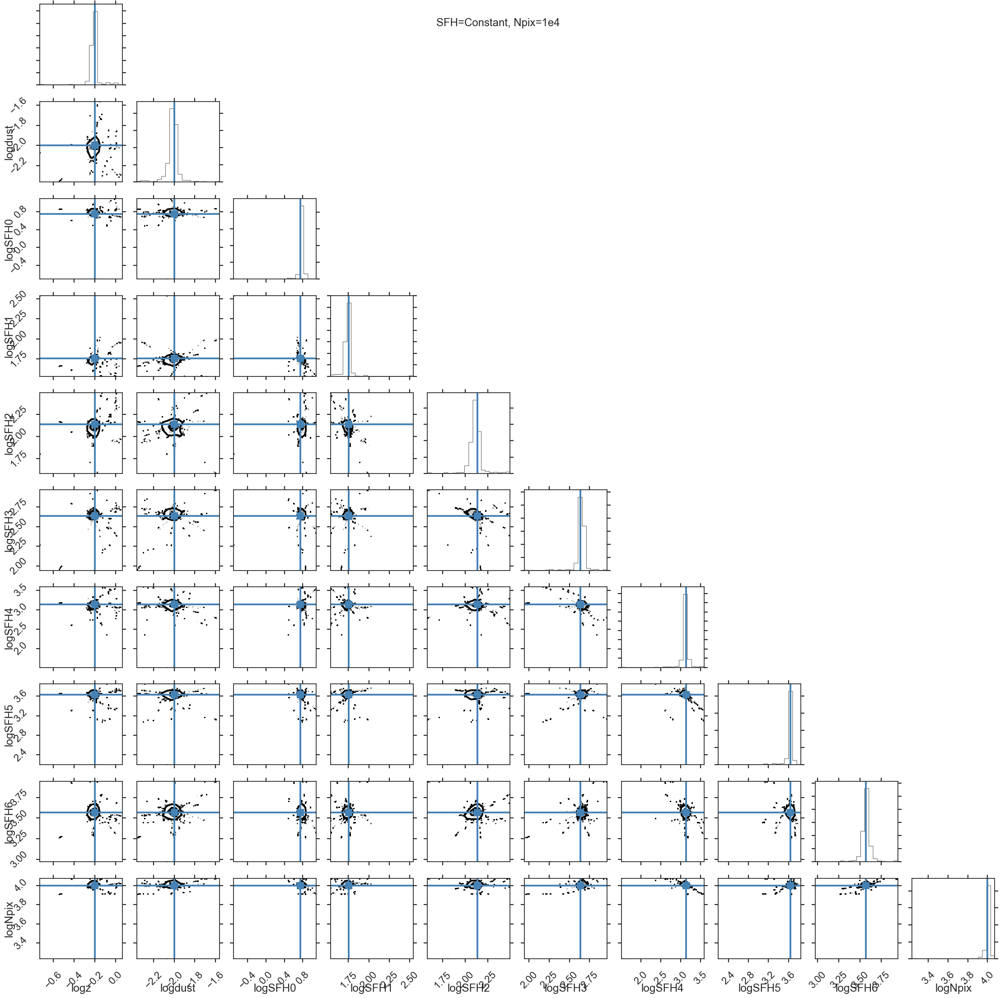

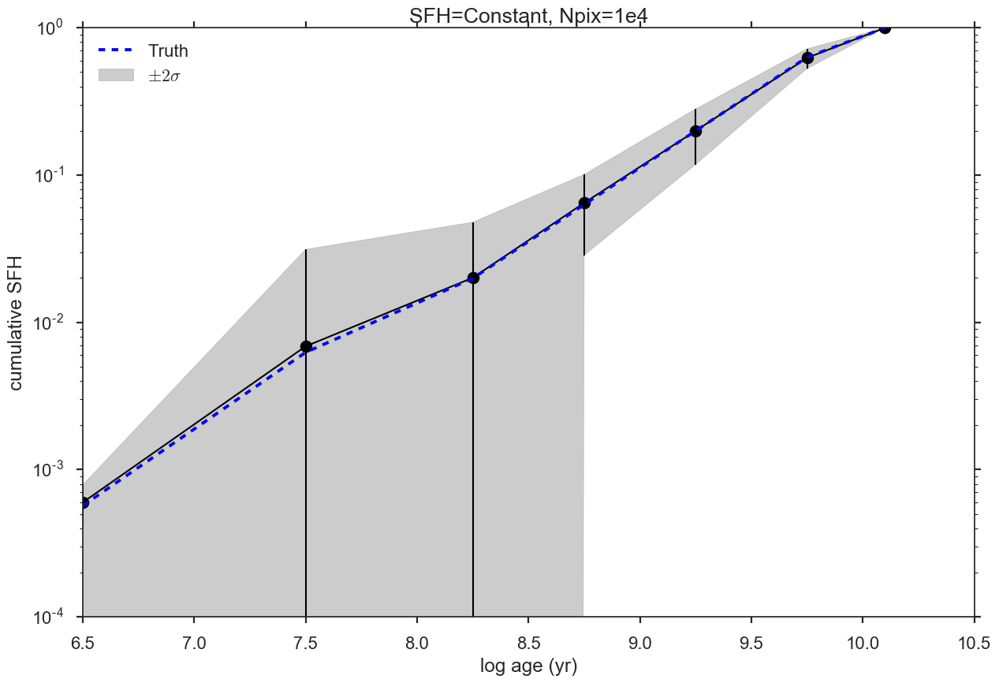

In [28]:
run_1e4 = PCMD_run('results/FULL_1e4_mock.csv', truths=FULL_truths(Npix=1e4), title='SFH=Constant, Npix=1e4')
run_1e4.chain_plot()
run_1e4.corner_plot()
run_1e4.cumSFH_plot()

(array([  6.43579996e-04,   1.60292920e-02,   4.11710572e-02,
         1.00922763e-01,   2.53704561e-01,   6.66285799e-01,
         1.00000000e+00]), array([  5.38146618e-04,   6.78188267e-03,   9.50995208e-03,
         1.66332520e-02,   6.45882643e-02,   9.22112738e-02,
         2.06611319e-16]))


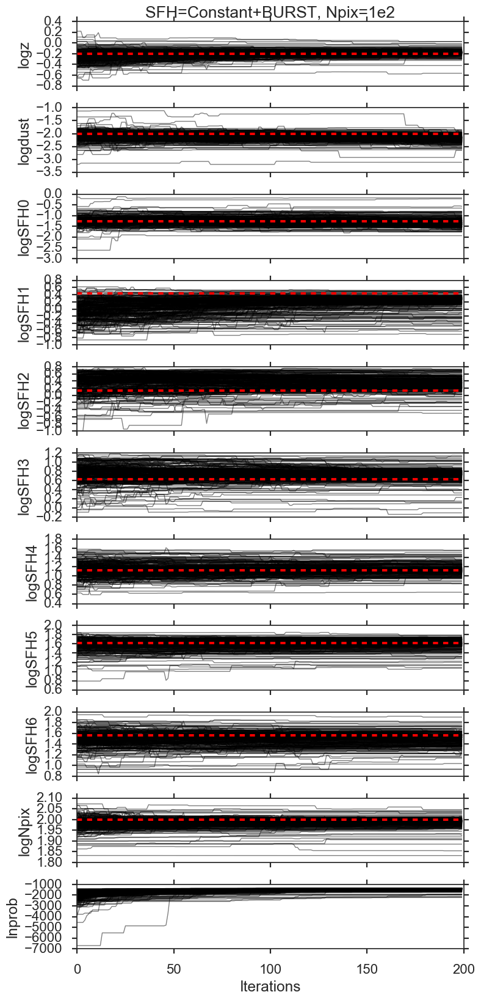

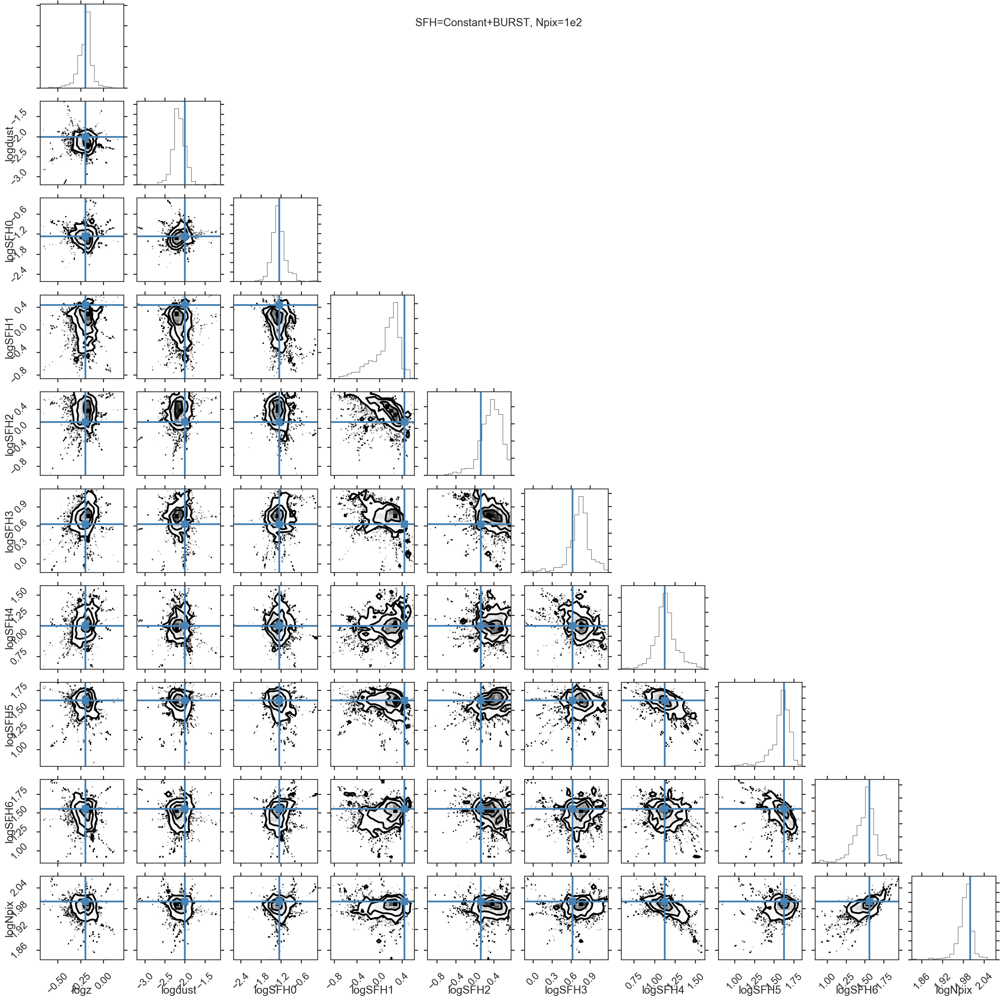

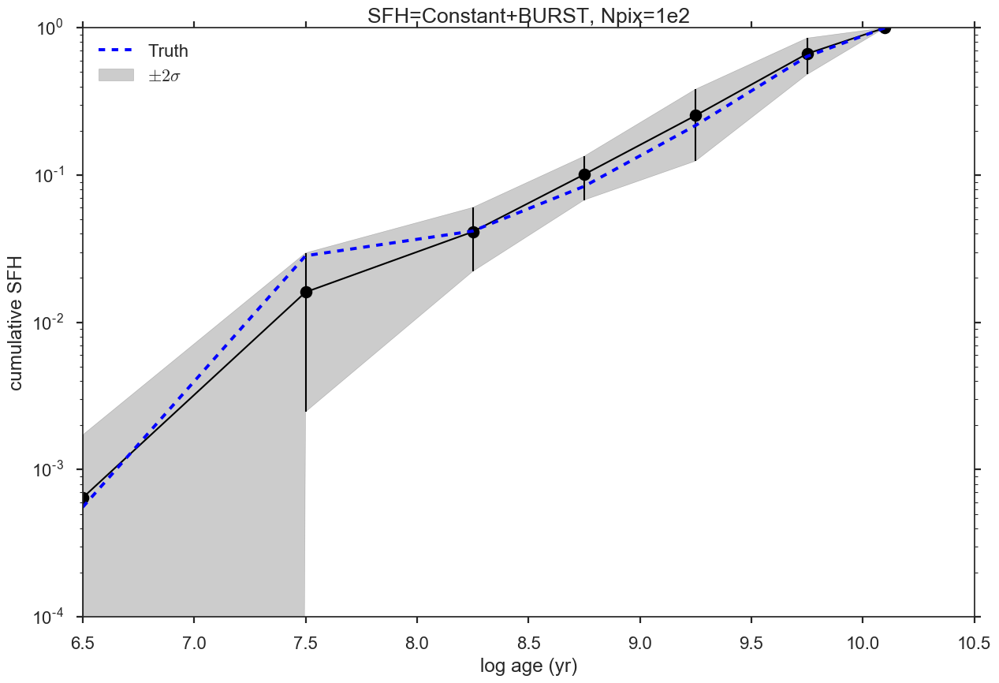

In [30]:
run_burst = PCMD_run('results/BURST_mock.csv', truths=BURST_truths(), title='SFH=Constant+BURST, Npix=1e2')
run_burst.chain_plot()
run_burst.corner_plot()
run_burst.cumSFH_plot()

(array([ 0.00852131,  0.08575586,  0.2273365 ,  0.63034348,  0.9614151 ,
        0.99995536,  1.        ]), array([  1.12753639e-03,   4.80664077e-03,   1.35950260e-02,
         2.96825330e-02,   8.96380676e-03,   9.37890279e-06,
         3.02796666e-16]))


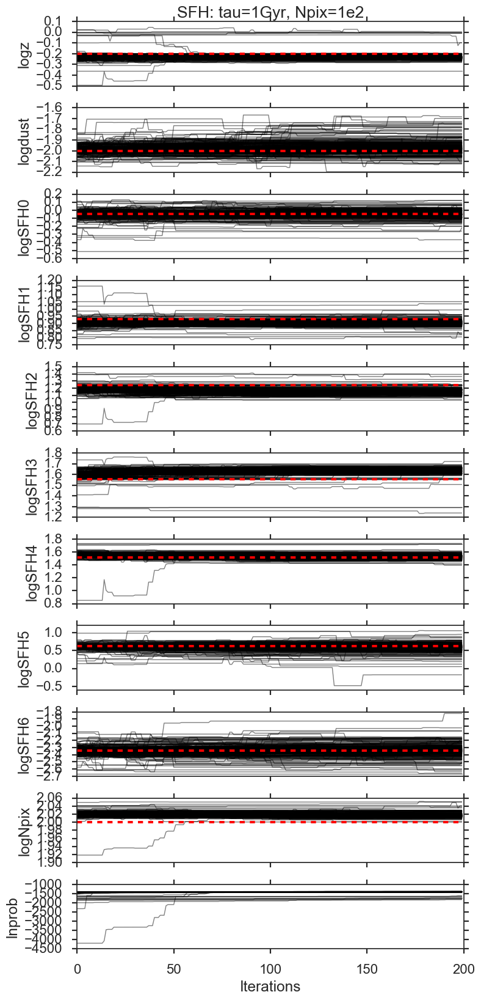

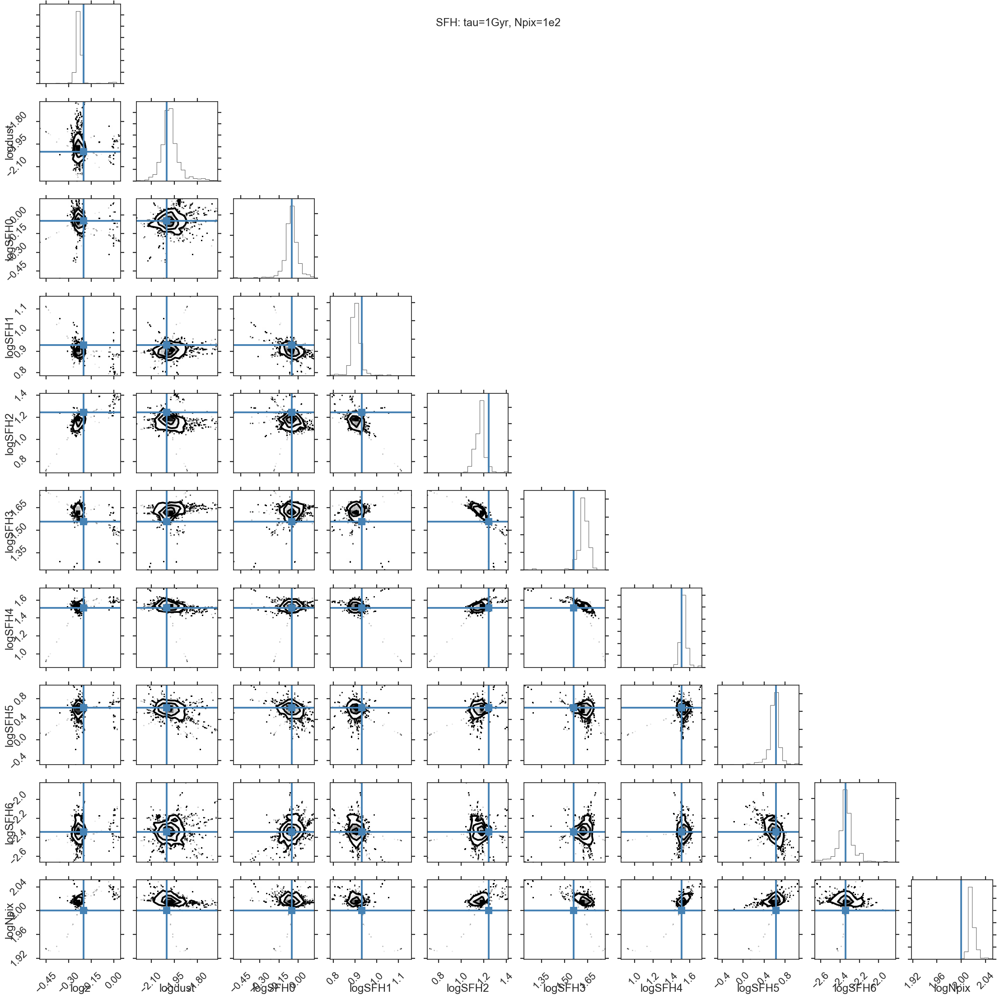

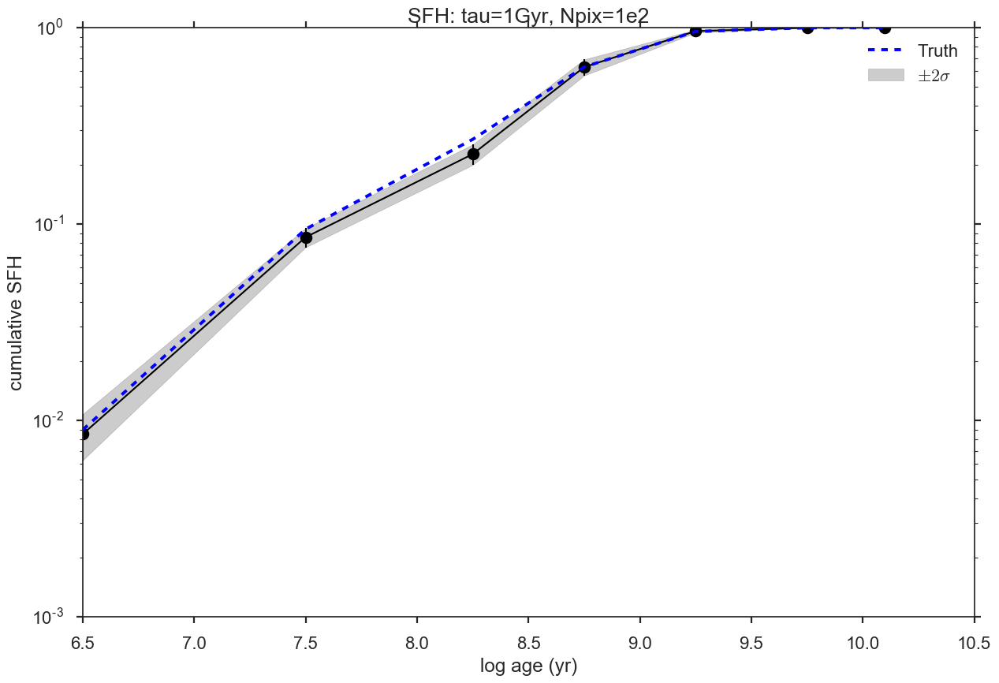

In [31]:
run_tau = PCMD_run('results/TAU_mock.csv', truths=TAU_truths(), title='SFH: tau=1Gyr, Npix=1e2')
run_tau.chain_plot()
run_tau.corner_plot()
run_tau.cumSFH_plot()

(array([  1.21011045e-04,   1.22607448e-03,   2.88700938e-03,
         6.62055689e-03,   1.43114147e-01,   7.50885092e-01,
         1.00000000e+00]), array([  2.06076412e-04,   9.02565196e-04,   2.73896389e-03,
         7.64048286e-03,   8.30817988e-02,   1.51118497e-01,
         3.07714324e-16]))


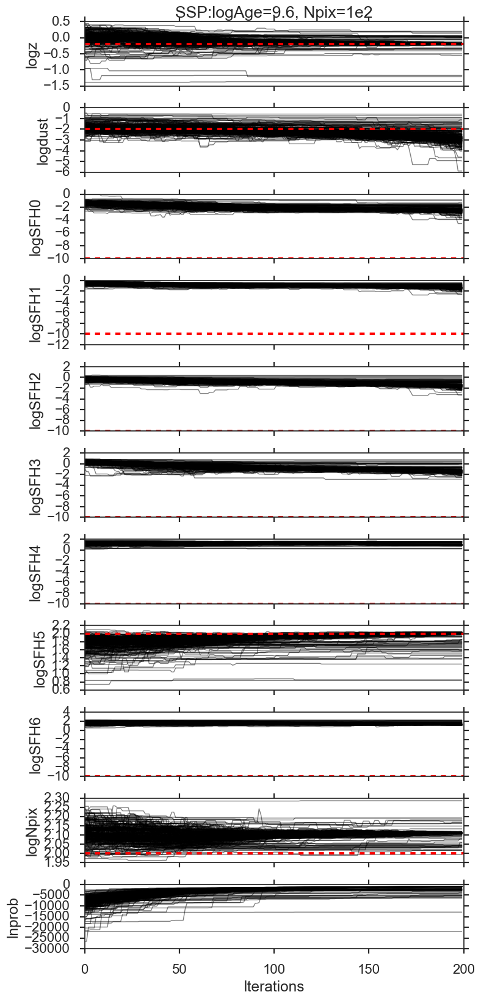

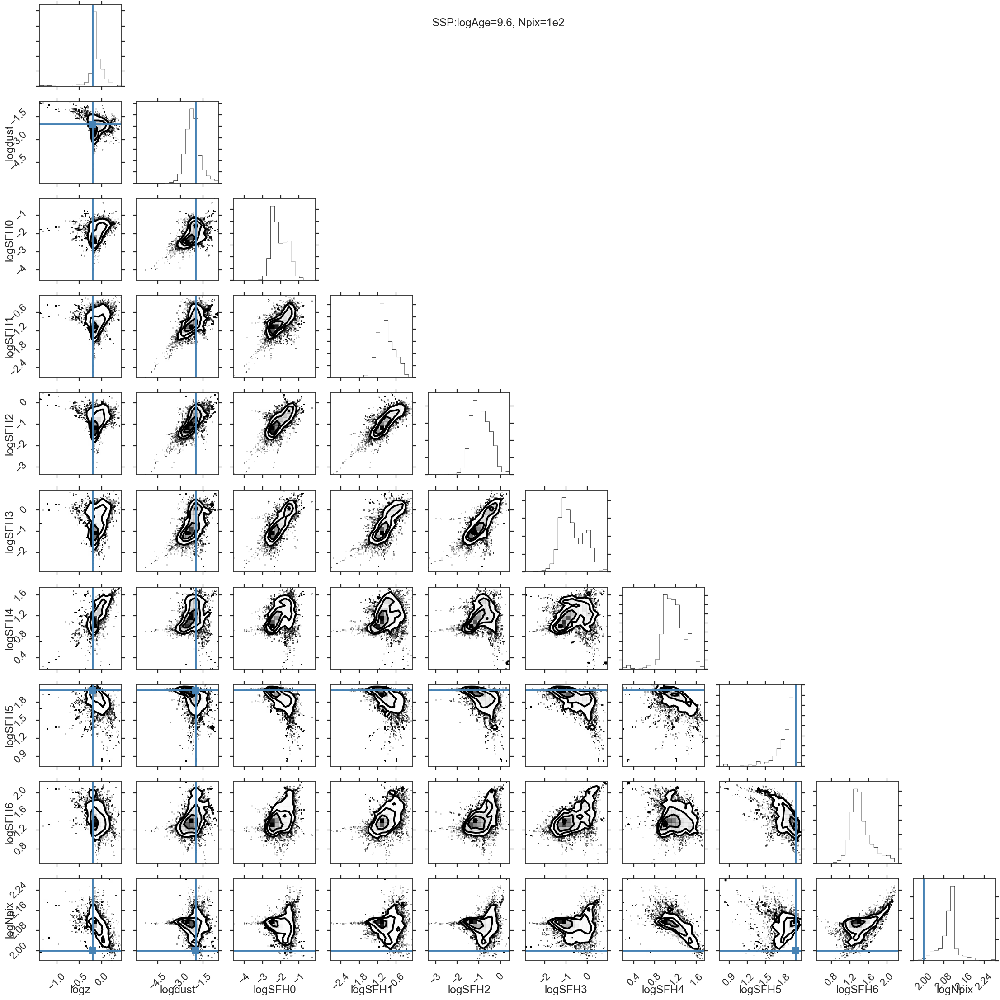

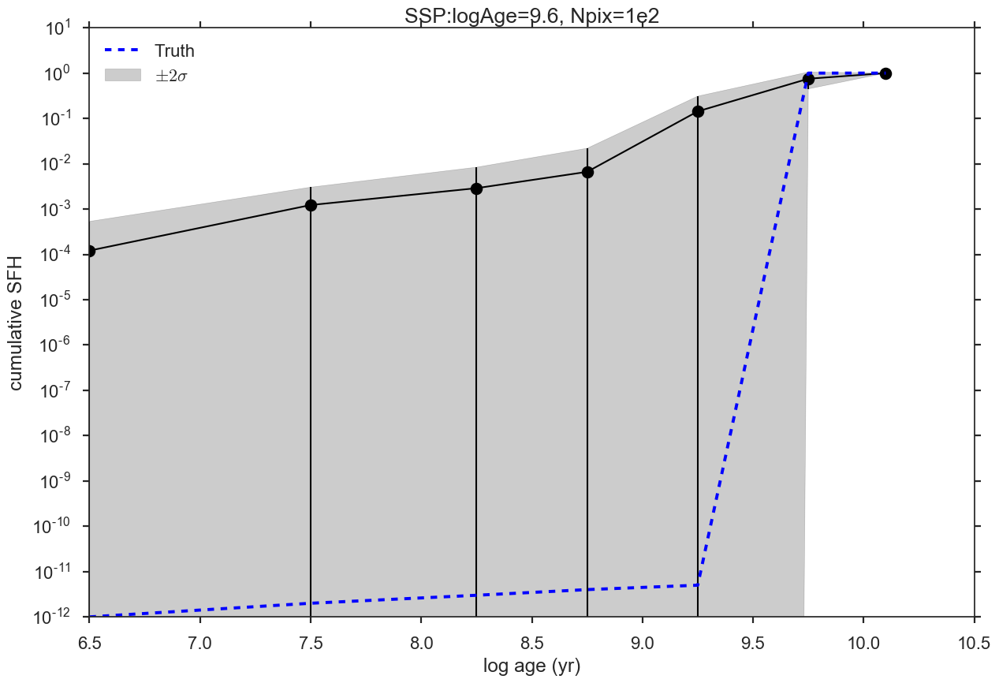

In [34]:
run_SSP_as_FULL = PCMD_run('results/SSP_as_FULL_mock.csv', truths=SSP_as_FULL_truths(), title='SSP:logAge=9.6, Npix=1e2')
run_SSP_as_FULL.chain_plot()
run_SSP_as_FULL.corner_plot()
run_SSP_as_FULL.cumSFH_plot()

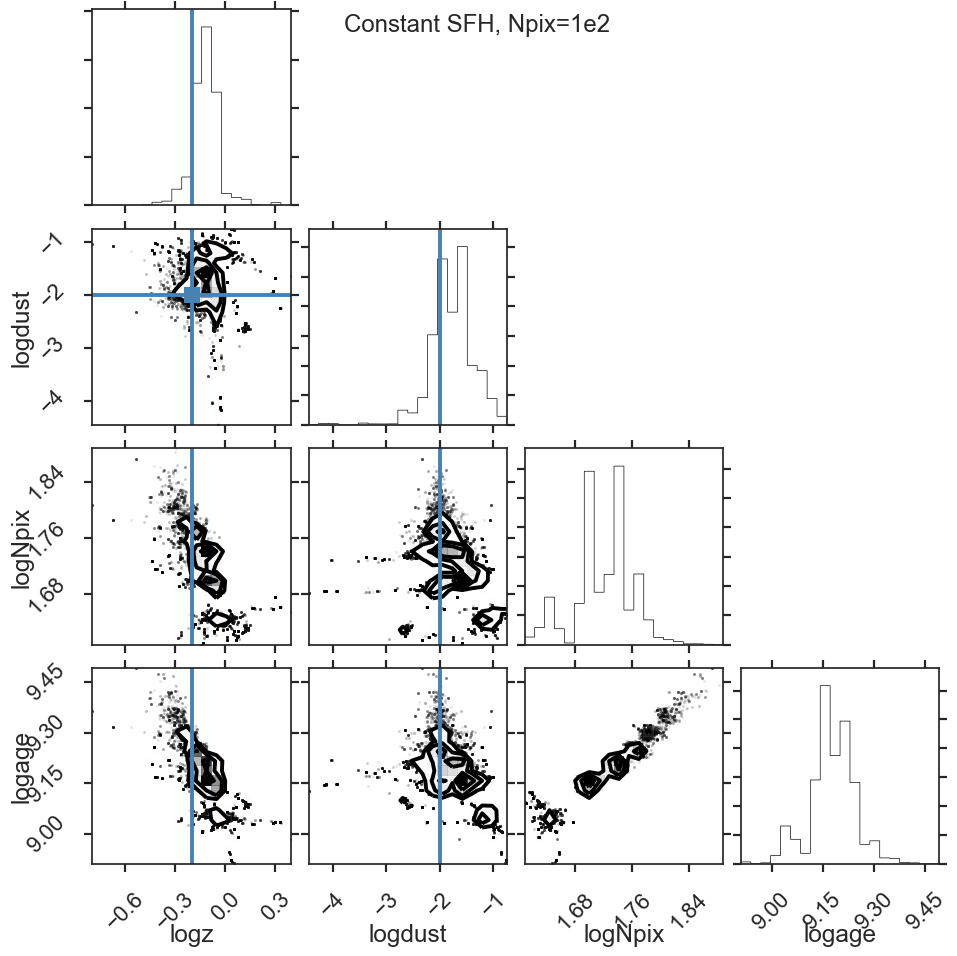

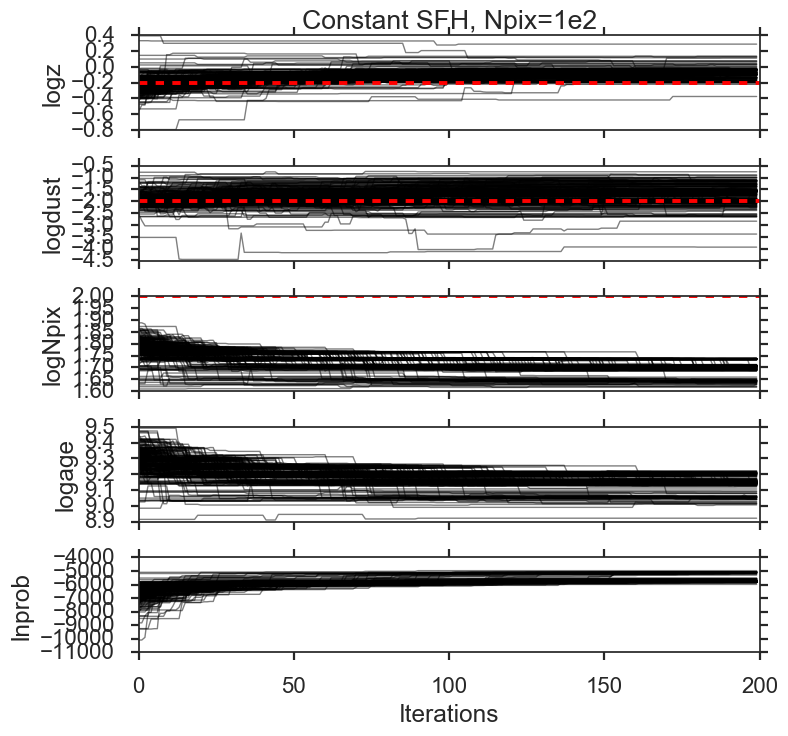

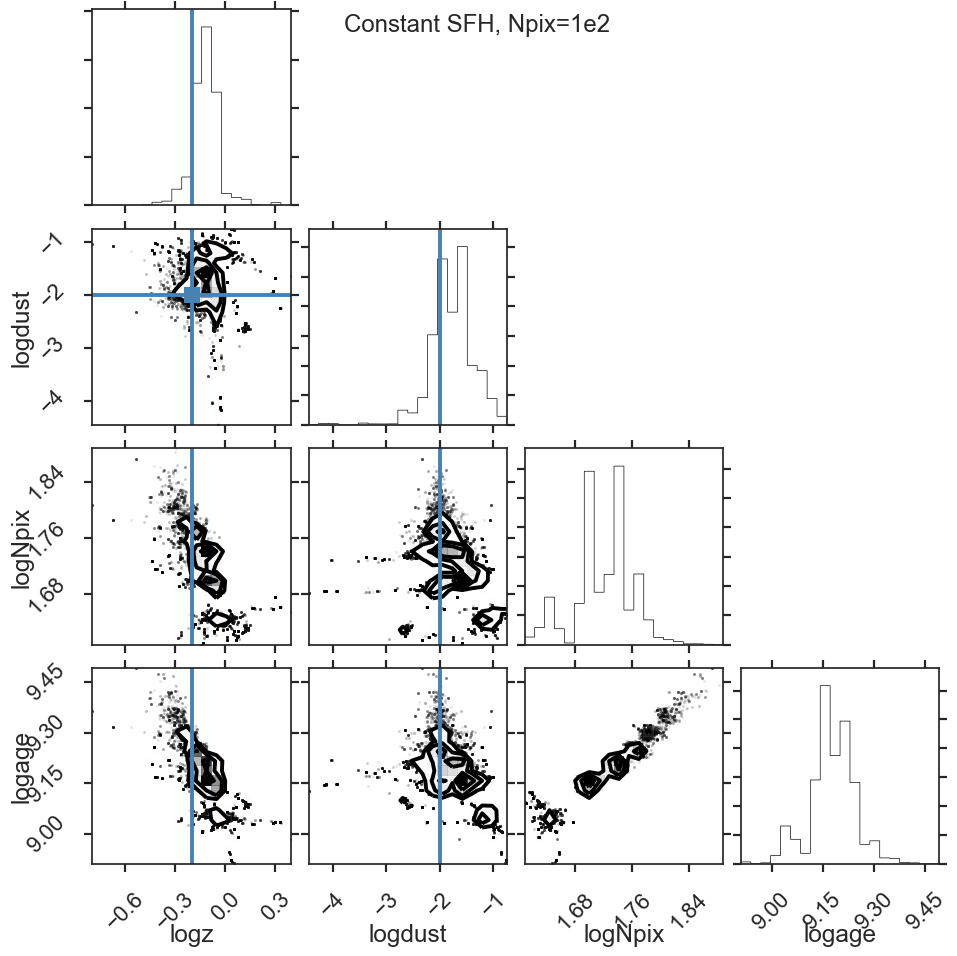

In [38]:
run_FULL_as_SSP = PCMD_run('results/FULL_as_SSP_mock.csv', truths=FULL_as_SSP_truths(), simple=True, title='Constant SFH, Npix=1e2')
run_FULL_as_SSP.chain_plot()
run_FULL_as_SSP.corner_plot()
# run_FULL_as_SSP.cumSFH_plot()

# Timing

In [17]:
n_gpus = [1,2,4,8]
time = []
time.append(4*3600. + 40*60. + 34.)
time.append(3*3600. + 18*60. + 1.)
time.append(1*3600. + 0*60. + 55.)
time.append(0.*3600. + 33*60. + 1.)
time = np.array(time)
per_sec = 512*20. / time

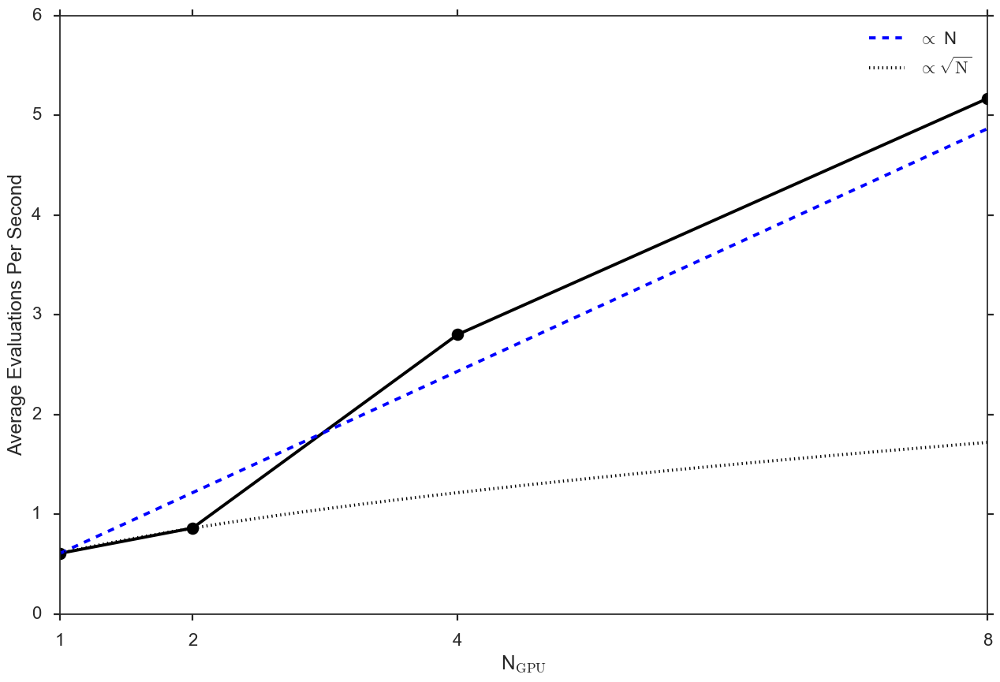

In [34]:
plt.plot(n_gpus, per_sec, 'ko-')
plt.xticks([1,2,4,8]), plt.ylabel('Average Evaluations Per Second')
x = np.linspace(1, 8, 100)
plt.plot(x, per_sec[0] * x, 'b--', label=r'$\propto$ N')
plt.plot(x, per_sec[0] * x**0.5, 'k:', label=r'$\propto \sqrt{\mathrm{N}}$')
plt.xlabel(r'N$_\mathrm{GPU}$')
plt.legend(loc=0)
plt.tight_layout()

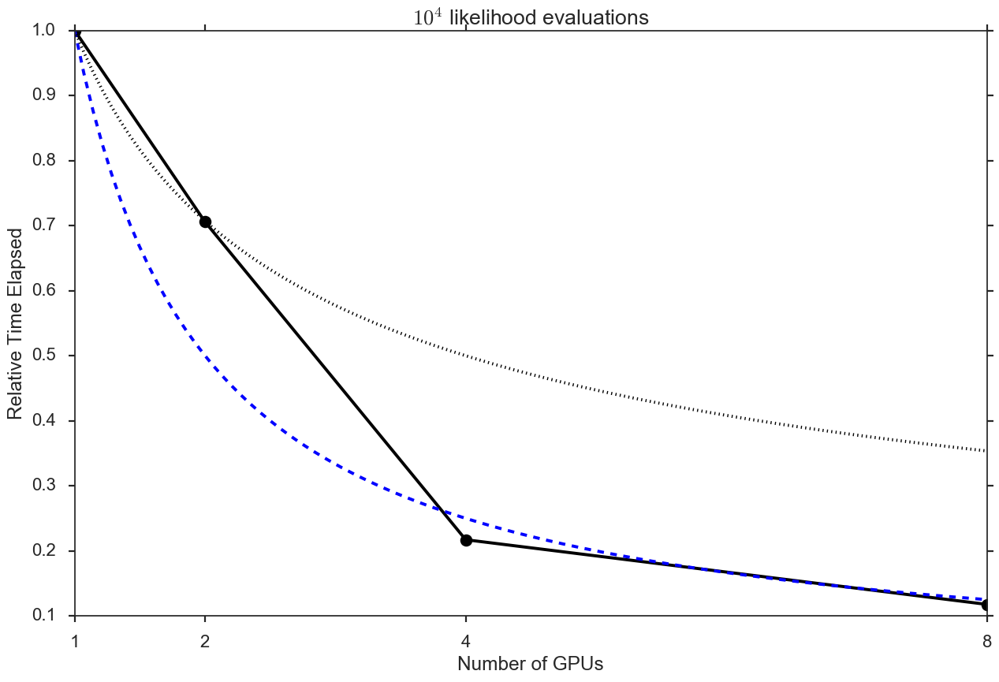

In [25]:
plt.plot(n_gpus, time / time[0], 'ko-')
plt.xticks([1,2,4,8]), plt.ylabel('Relative Time Elapsed')
x = np.linspace(1, 8, 100)
plt.plot(x, x**-1., 'b--', label='')
plt.plot(x, x**-0.5, 'k:')
plt.xlabel(r'Number of GPUs'), plt.title(r'$10^4$ likelihood evaluations')
plt.tight_layout()


# Emcee-Ball size test

In [8]:
small = PCMD_run('results/ball_small.csv', truths=FULL_truths(), title='Small Ball')
med = PCMD_run('results/ball_medium.csv', truths=FULL_truths(), title='Medium Ball')
large = PCMD_run('results/ball_large.csv', truths=FULL_truths(), title='Large Ball')

(array([  5.71189079e-04,   5.98088656e-03,   1.81787192e-02,
         5.87986461e-02,   1.92169174e-01,   6.35451699e-01,
         1.00000000e+00]), array([  5.79838688e-05,   2.73425143e-04,   8.49366237e-04,
         1.36158360e-03,   5.58827222e-03,   1.50855183e-02,
         3.05246588e-16]))
(array([  5.83530389e-04,   6.14672025e-03,   1.87769371e-02,
         5.89038902e-02,   1.95515963e-01,   6.39645208e-01,
         1.00000000e+00]), array([  1.17611901e-04,   7.73448422e-04,   2.03041061e-03,
         5.99457691e-03,   2.15995401e-02,   3.65597907e-02,
         2.98511909e-16]))
(array([  7.74867345e-04,   7.77901673e-03,   3.23645083e-02,
         7.95081060e-02,   2.23916493e-01,   6.34652694e-01,
         1.00000000e+00]), array([  1.27246395e-03,   9.57481838e-03,   9.75845343e-02,
         1.15761017e-01,   1.53474542e-01,   1.45595535e-01,
         2.68863425e-16]))


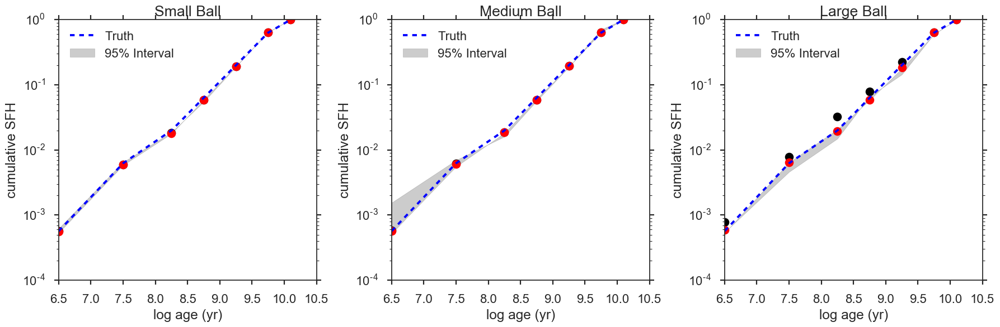

In [15]:
fig, axes = plt.subplots(ncols=3, figsize=(18, 6))
small.cumSFH_plot(ax=axes[0])
med.cumSFH_plot(ax=axes[1])
large.cumSFH_plot(ax=axes[2])
plt.tight_layout();

In [ ]:
corner.corner()

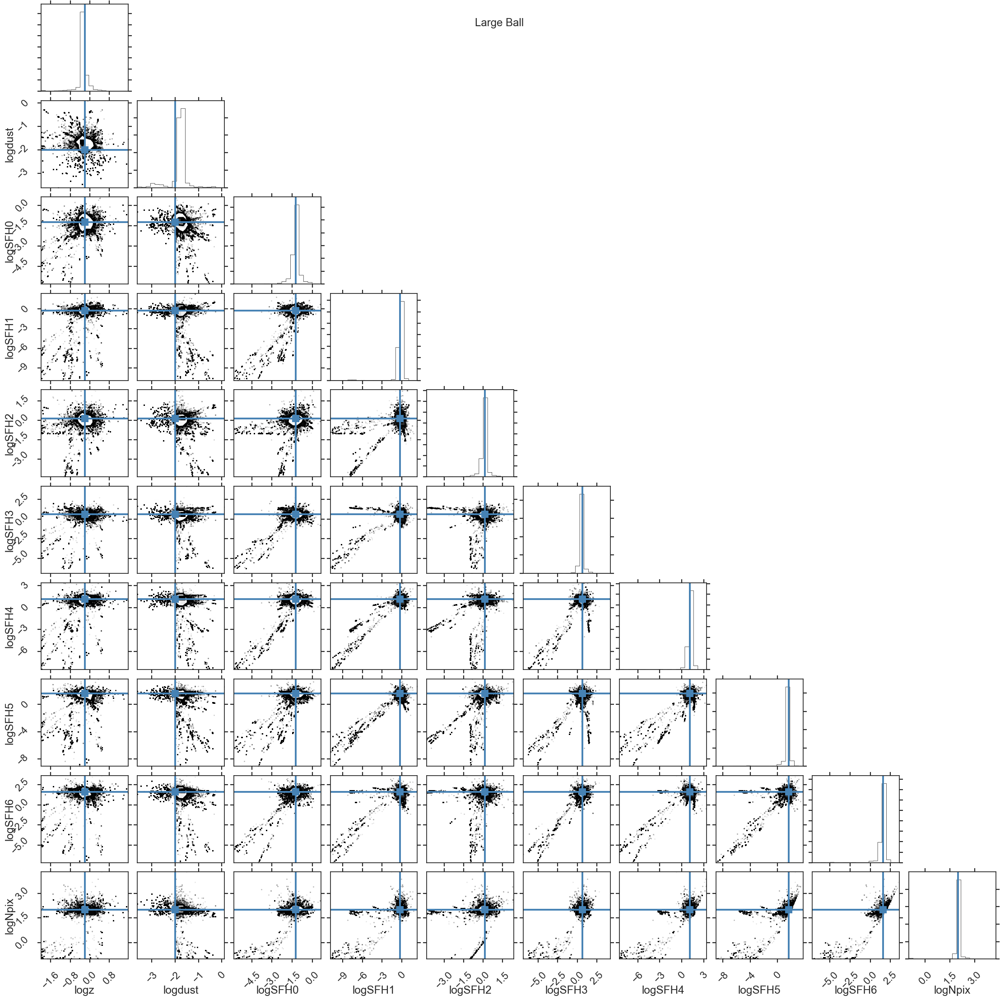

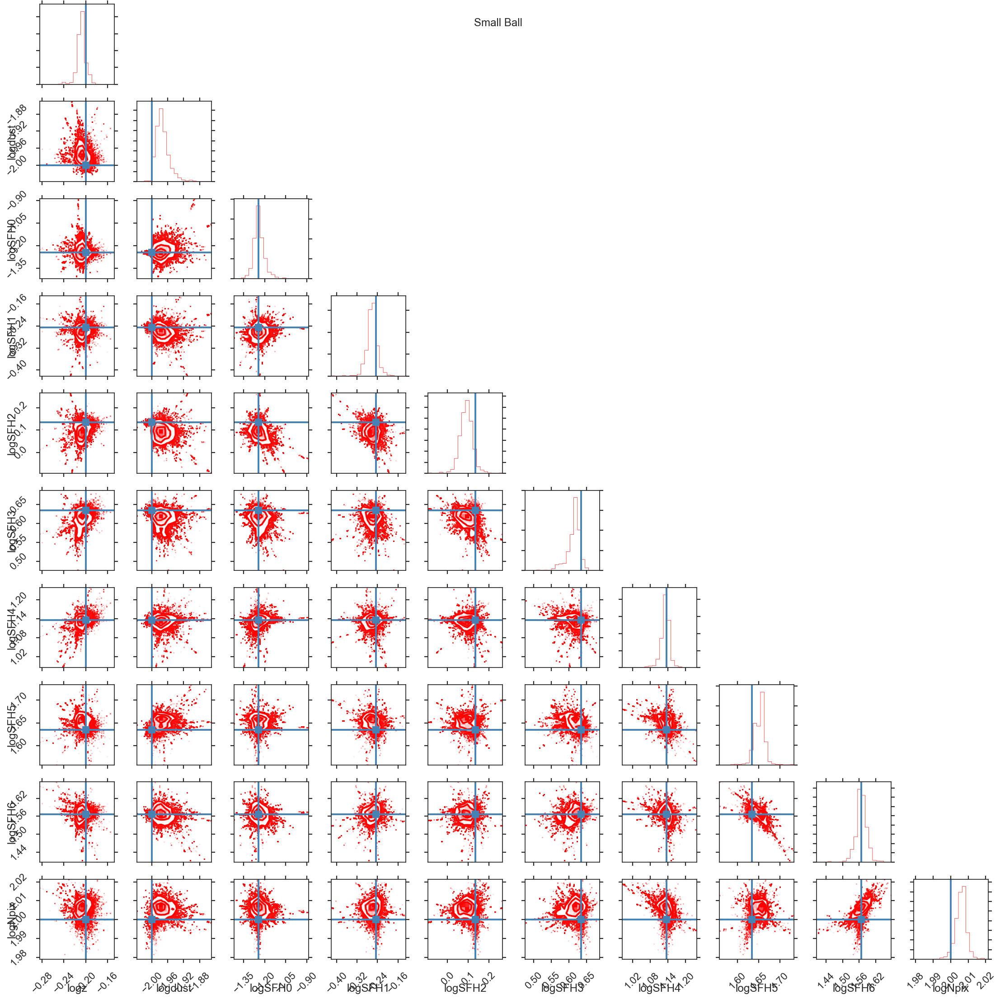

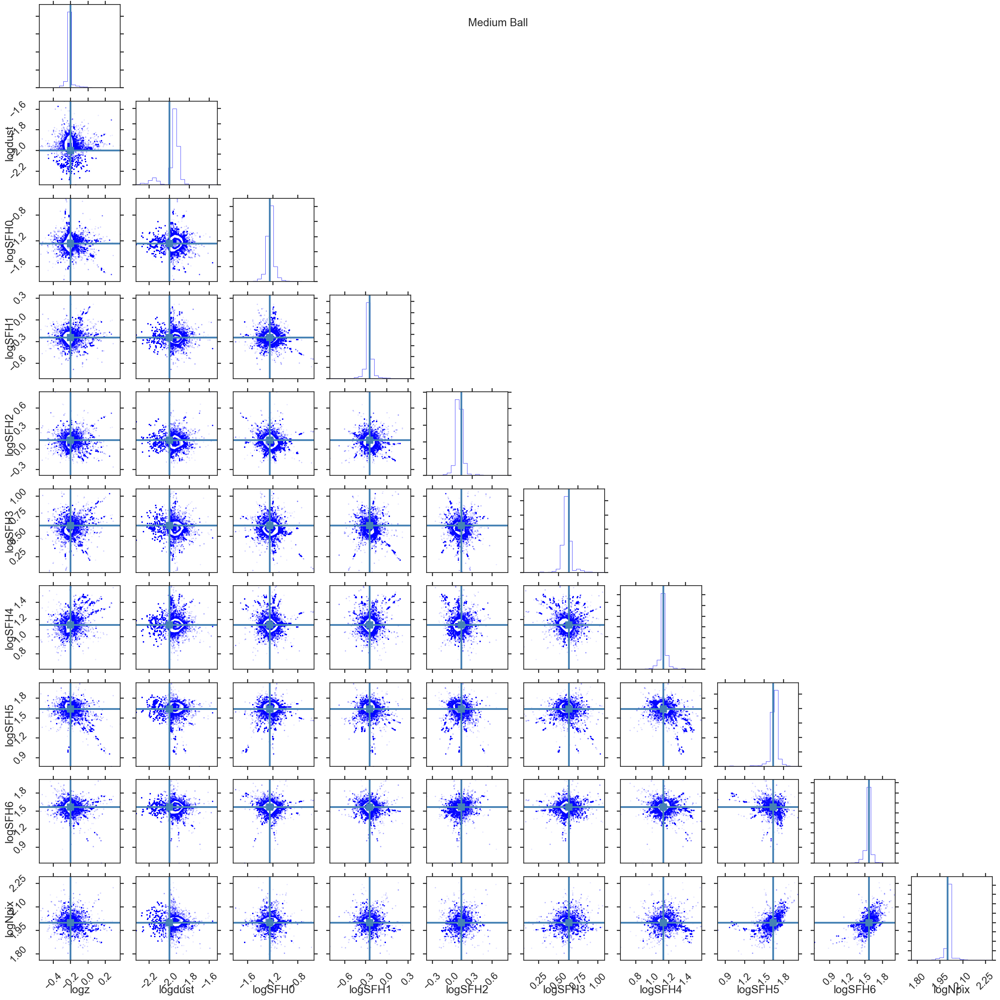

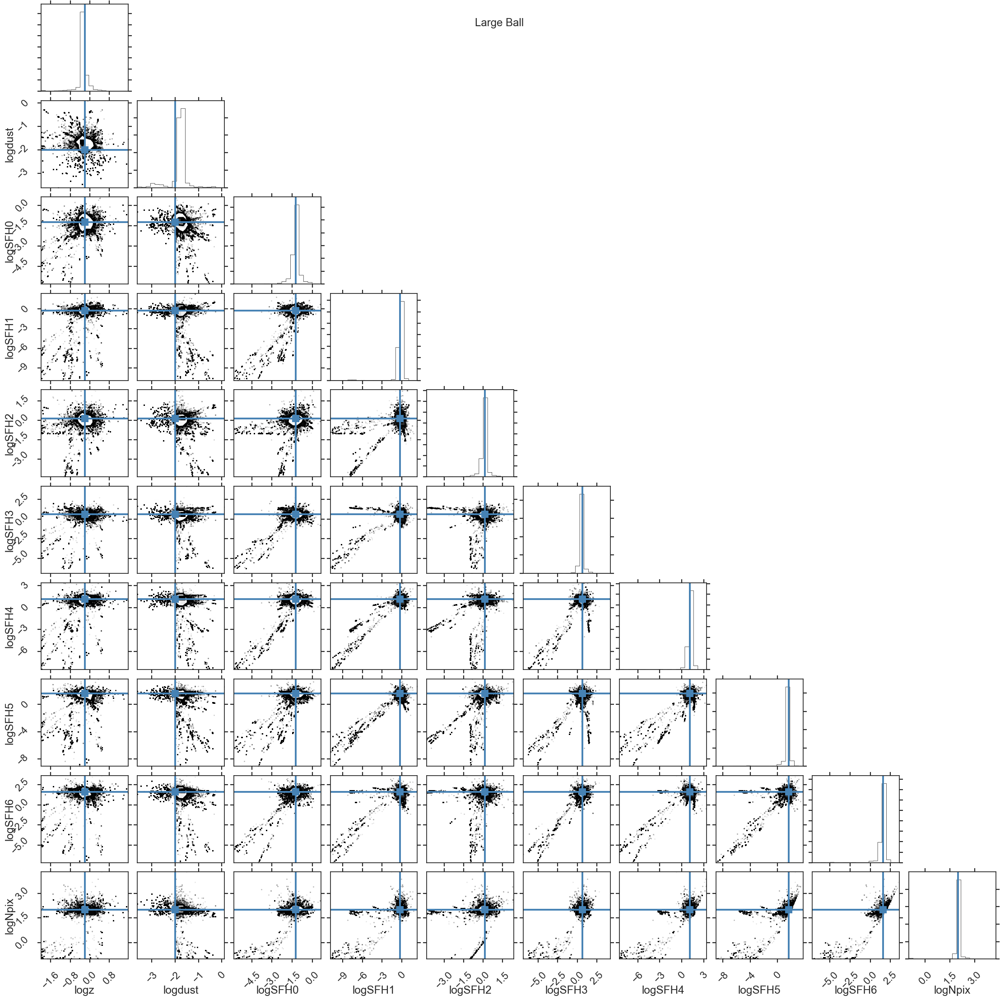

In [10]:
ax = small.corner_plot(color='r')
med.corner_plot(ax=ax, color='b')
large.corner_plot(ax=ax, color='k')

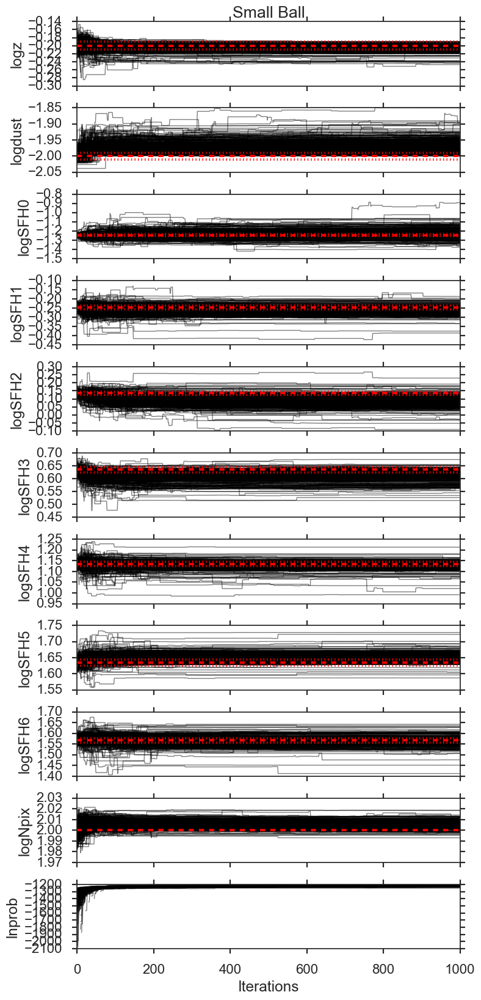

In [19]:
axes = small.chain_plot()
for i in range(len(axes) - 2):
    t = small.truths[i]
    sig = 0.01
    axes[i].axhline(y=t - sig, color='r', ls=':')
    axes[i].axhline(y=t+sig, color='r', ls=':')

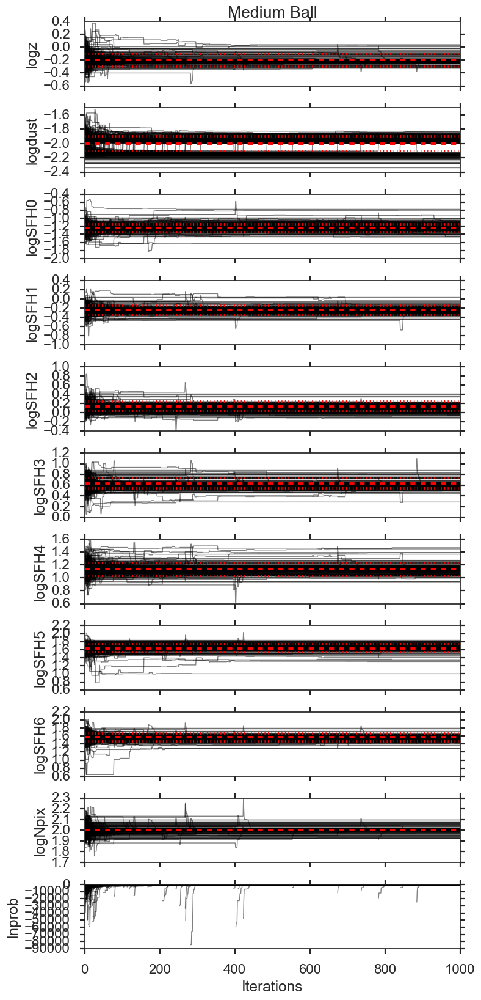

In [20]:
axes = med.chain_plot()
for i in range(len(axes) - 2):
    t = med.truths[i]
    sig = 0.1
    axes[i].axhline(y=t - sig, color='r', ls=':')
    axes[i].axhline(y=t+sig, color='r', ls=':')

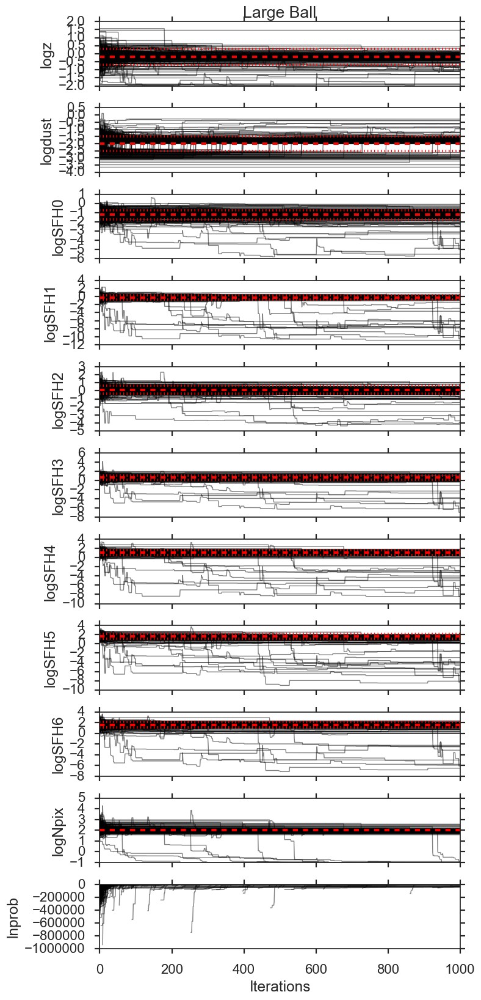

In [21]:
axes = large.chain_plot()
for i in range(len(axes) - 2):
    t = large.truths[i]
    sig = 0.5
    axes[i].axhline(y=t - sig, color='r', ls=':')
    axes[i].axhline(y=t+sig, color='r', ls=':')

# Acceptance Fraction Tests

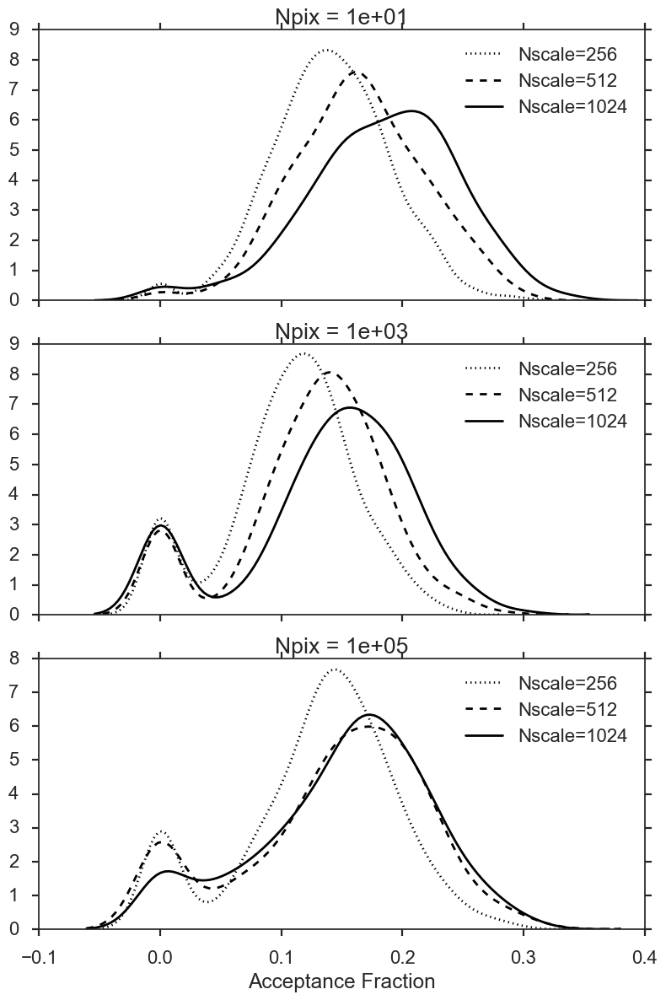

In [8]:
N_scale = [256, 512, 1024]
N_pix = [1e1, 1e3, 1e5]
ls = [':', '--', '-']
c = ['k', 'r', 'c']
fig, axes = plt.subplots(nrows=3, figsize=(8, 12), sharex=True)
for i in range(3):
    for j in range(3):
        d = 1 + i*3 + j
        test = PCMD_run('results/NscaleNpix%d.csv'%(d), truths=FULL_truths(), title='Nscale=%d'%(N_scale[j]))
        test.accept_frac_plot(kde=True, lw=2, alpha=1., ax=axes[i], label=True, ls=ls[j], c='k')
        Ns = N_scale[j]
        Np = N_pix[i]
    axes[i].set_title('Npix = %.0e'%(Np))
axes[0].legend(loc=0)
axes[-1].set_xlabel('Acceptance Fraction')
plt.tight_layout()

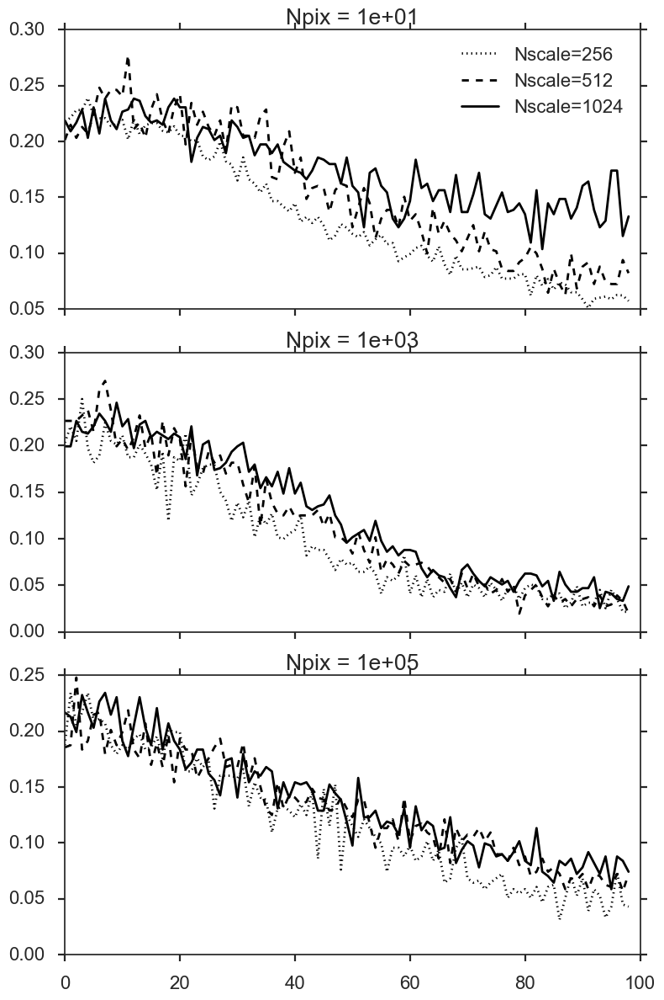

In [161]:
N_scale = [256, 512, 1024]
N_pix = [1e1, 1e3, 1e5]
ls = [':', '--', '-']
c = ['k', 'r', 'c']
fig, axes = plt.subplots(nrows=3, figsize=(8, 12), sharex=True)
for i in range(3):
    for j in range(3):
        d = 1 + i*3 + j
        test = PCMD_run('results/NscaleNpix%d.csv'%(d), truths=FULL_truths(), title='Nscale=%d'%(N_scale[j]))
        test.accept_chain_plot(lw=2, alpha=1., ax=axes[i], label=True, ls=ls[j], c='k')
        Ns = N_scale[j]
        Np = N_pix[i]
    axes[i].set_title('Npix = %.0e'%(Np))
axes[0].legend(loc=0)
plt.tight_layout()

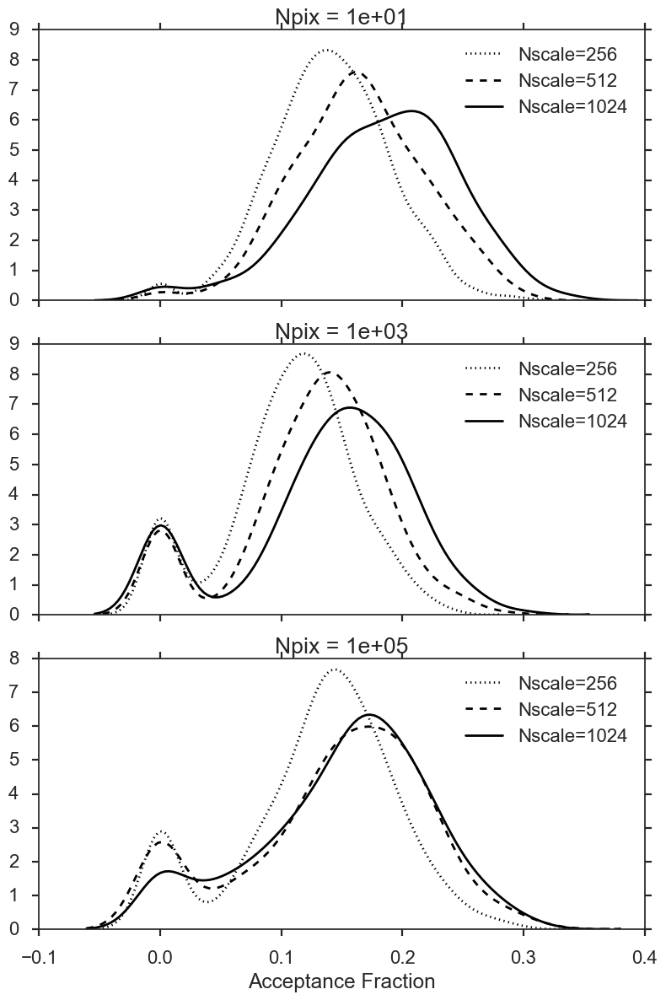

In [8]:
test = PCMD_run('results/NscaleNpix.csv'%(d), truths=FULL_truths(), title='Nscale=%d'%(N_scale[j]))
test.accept_frac_plot(kde=True, lw=2, alpha=1., ax=axes[i], label=True, ls=ls[j], c='k')


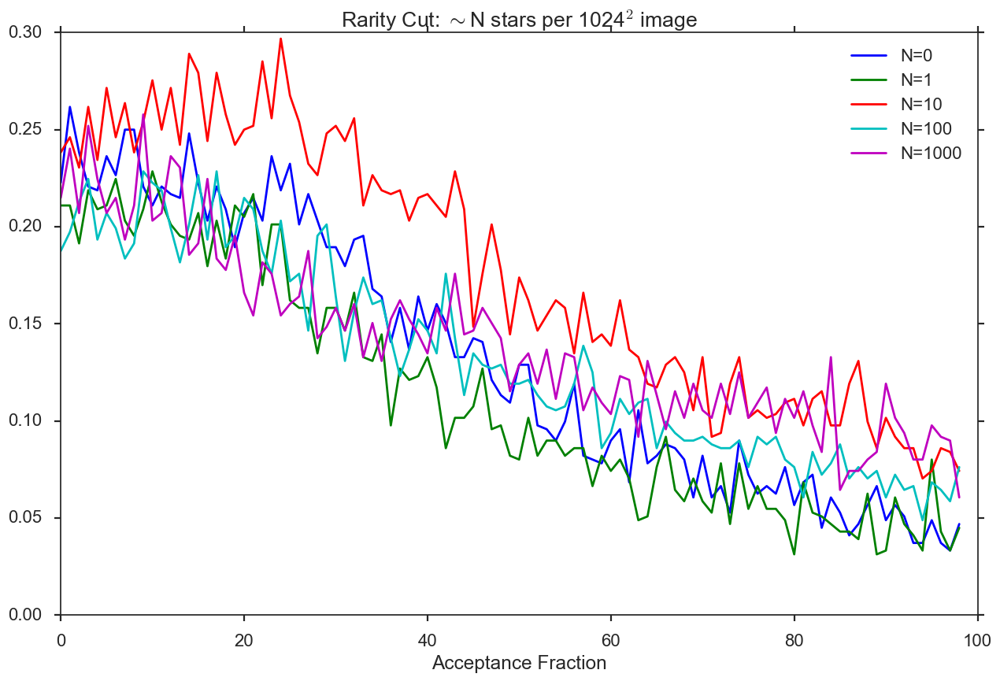

In [162]:
fig, ax = plt.subplots()
cuts = [0, 1, 10, 100, 1000]
for i in range(5):
    test = PCMD_run('results/rare%d.csv'%(i+1), truths=FULL_truths(), title='N=%d'%(cuts[i]))
    test.accept_chain_plot(lw=2, alpha=1., ax=ax, label=True)
ax.set_xlabel('Acceptance Fraction')
ax.set_title(r'Rarity Cut: $\sim$N stars per 1024$^2$ image')
ax.legend(loc=0)
plt.tight_layout()

In [15]:
rare1 = PCMD_run('results/rare1.csv', truths=FULL_truths(), title='N=%d'%(cuts[0]))
rare2 = PCMD_run('results/rare2.csv', truths=FULL_truths(), title='N=%d'%(cuts[1]))
rare3 = PCMD_run('results/rare3.csv', truths=FULL_truths(), title='N=%d'%(cuts[2]))
rare4 = PCMD_run('results/rare4.csv', truths=FULL_truths(), title='N=%d'%(cuts[3]))
rare5 = PCMD_run('results/rare5.csv', truths=FULL_truths(), title='N=%d'%(cuts[4]))

(array([  5.87668865e-04,   6.15967870e-03,   1.90454839e-02,
         5.90375844e-02,   1.94738733e-01,   6.37949700e-01,
         1.00000000e+00]), array([  1.00834423e-04,   7.26739327e-04,   1.86249770e-03,
         5.69332266e-03,   2.24402652e-02,   4.15297103e-02,
         2.85658624e-16]))
(array([  7.72479429e-04,   7.49558884e-03,   2.44551848e-02,
         8.38138895e-02,   2.25915132e-01,   6.88534605e-01,
         1.00000000e+00]), array([  2.30474421e-04,   1.58548461e-03,   4.56396284e-03,
         1.01252507e-02,   2.90551576e-02,   6.56006881e-02,
         1.81020701e-16]))
(array([  6.06491313e-04,   1.16532952e-02,   3.02671498e-02,
         7.17760293e-02,   2.10558801e-01,   6.18924339e-01,
         1.00000000e+00]), array([  3.82772004e-04,   4.17074854e-02,   7.07124859e-02,
         6.83328826e-02,   5.33579141e-02,   6.21521184e-02,
         2.27654066e-16]))


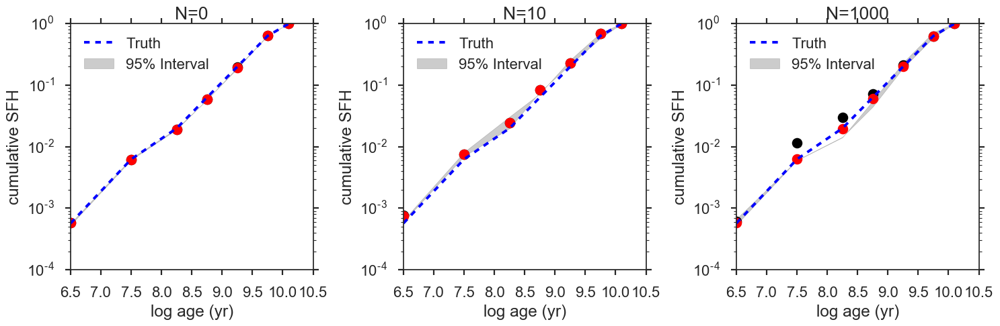

In [16]:
fig, axes = plt.subplots(figsize=(15, 5), ncols=3)
rare1.cumSFH_plot(ax=axes[0], burn=40)
rare3.cumSFH_plot(ax=axes[1], burn=40)
rare5.cumSFH_plot(ax=axes[2], burn=40)
plt.tight_layout()

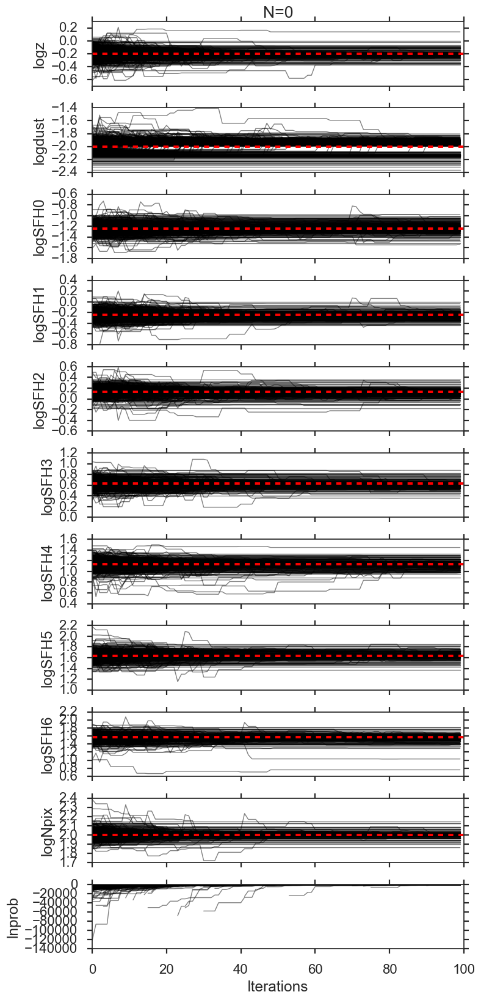

In [17]:
_ = rare1.chain_plot()

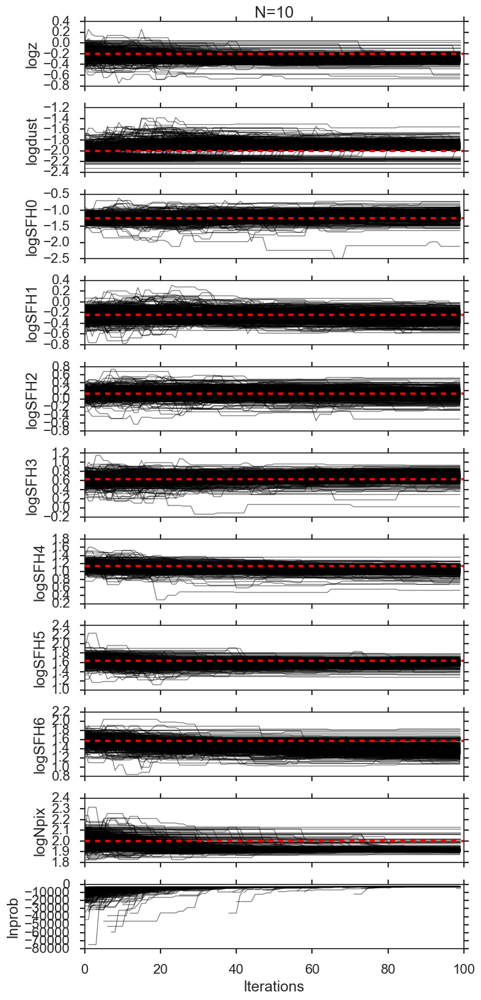

In [18]:
_ = rare3.chain_plot()

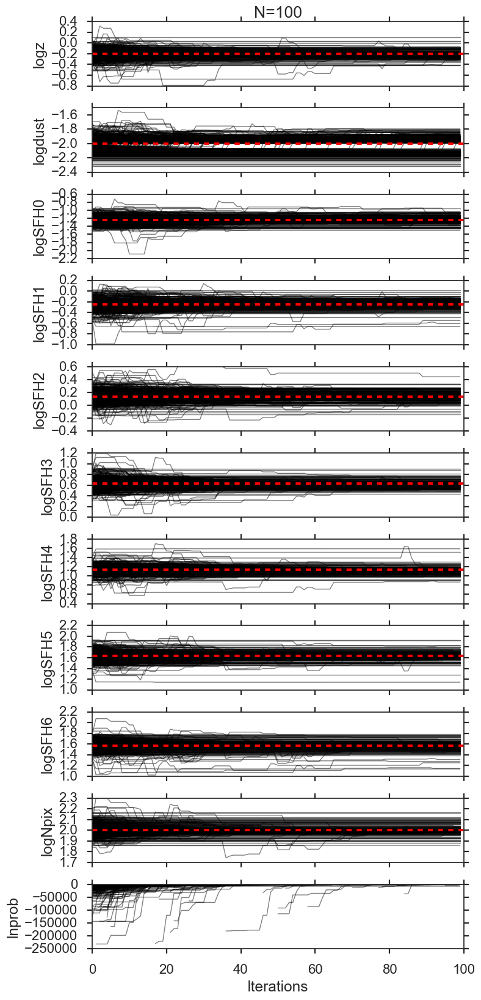

In [21]:
_ = rare4.chain_plot()

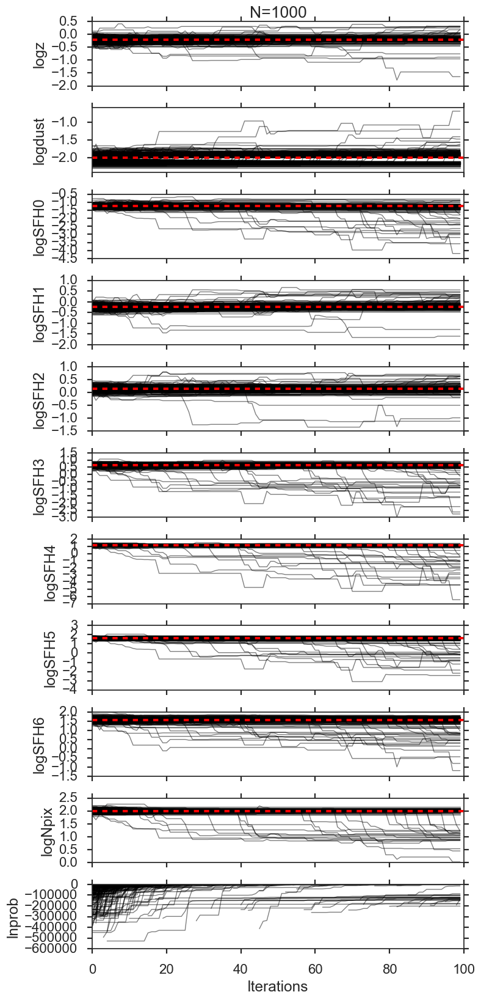

In [19]:
_ = rare5.chain_plot()